# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

In this notebook, a template is provided for you to implement your functionality in stages which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission, if necessary. Sections that begin with **'Implementation'** in the header indicate where you should begin your implementation for your project. Note that some sections of implementation are optional, and will be marked with **'Optional'** in the header.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

---

## Step 1: Dataset Exploration

Visualize the German Traffic Signs Dataset. This is open ended, some suggestions include: plotting traffic signs images, plotting the count of each sign, etc. Be creative!


The pickled data is a dictionary with 4 key/value pairs:

- features -> the images pixel values, (width, height, channels)
- labels -> the label of the traffic sign
- sizes -> the original width and height of the image, (width, height)
- coords -> coordinates of a bounding box around the sign in the image, (x1, y1, x2, y2). Based the original image (not the resized version).

In [1]:
import pickle
import numpy as np
np.set_printoptions(threshold=np.nan)
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
import matplotlib.gridspec as gridspec
import csv
import random
import os
import shutil
from sklearn.preprocessing import LabelBinarizer
from sklearn.cross_validation import train_test_split
import pandas as pd
from model3 import Model
from tqdm import tqdm
from sklearn.utils import shuffle
from time import localtime, strftime
from collections import Counter
from sklearn.metrics import confusion_matrix
%matplotlib inline

In [2]:
from CNN import CNN

In [3]:
cnn = CNN(use_gray = True, use_jitter = True)

Categorizing...
Categorization completes.
Splitting...
Train #=77400
Val #=19350
Splitting completes.


In [4]:
### To start off let's do a basic data summary.

# TODO: number of training examples
n_train = len(cnn.y_train_orig)

# TODO: number of testing examples
n_test = len(cnn.y_test)

# TODO: what's the shape of an image?
image_shape = (cv2.imread(cnn.X_train_paths[0])).shape[0]

# TODO: how many classes are in the dataset
n_classes = len(np.unique(cnn.y_train_orig))

print("Number of training examples =", n_train)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)

Number of training examples = 39209
Number of testing examples = 12630
Image data shape = 32
Number of classes = 43


Distribution of labels in training data


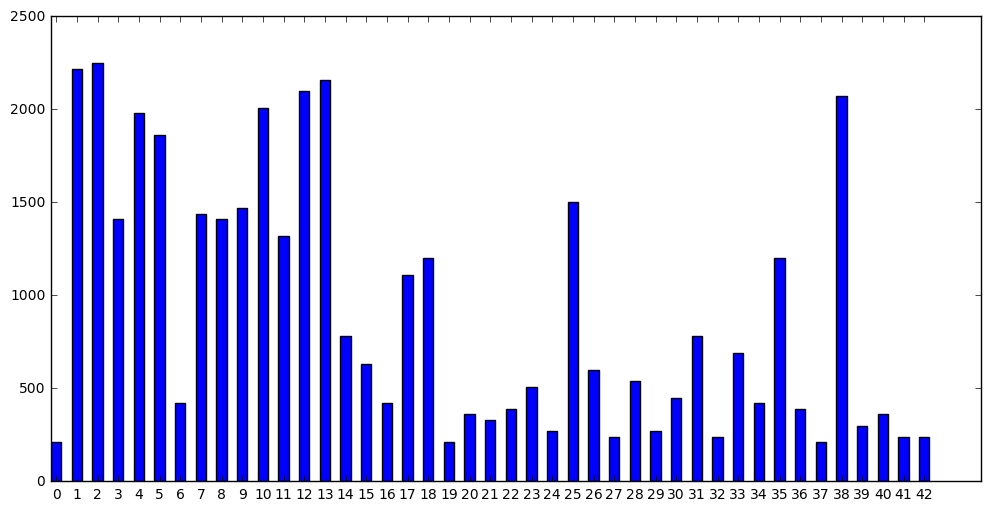

In [5]:
from collections import Counter
import numpy as np
ctr = Counter(sorted(cnn.y_train_orig))
print('Distribution of labels in training data')
labels, values = zip(*(ctr.items()))

indexes = np.arange(len(labels))
width =.5

plt.figure(figsize=(12, 6))
plt.bar(indexes, values, width)
plt.xticks(indexes + width * 0.5, labels)
plt.show()

Distribution of labels in testing data


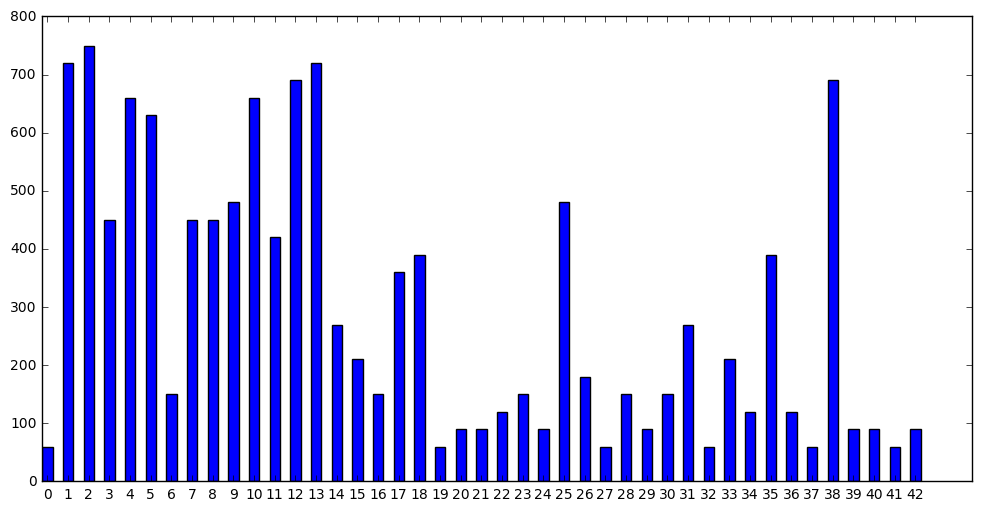

In [6]:
ctr = Counter(sorted(cnn.y_test))
print('Distribution of labels in testing data')
labels, values = zip(*(ctr.items()))

indexes = np.arange(len(labels))
width =.5

plt.figure(figsize=(12, 6))
plt.bar(indexes, values, width)
plt.xticks(indexes + width * 0.5, labels)
plt.show()

0:Speed limit (20km/h)


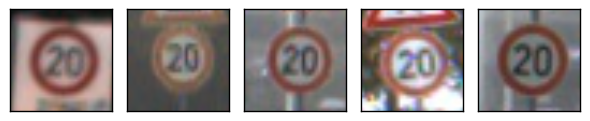

1:Speed limit (30km/h)


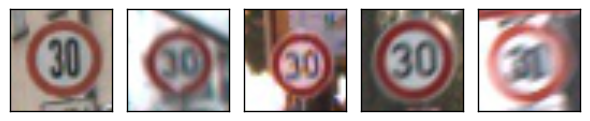

2:Speed limit (50km/h)


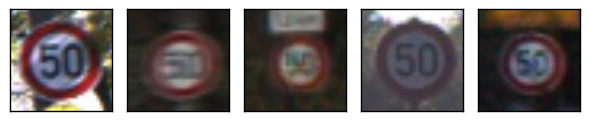

3:Speed limit (60km/h)


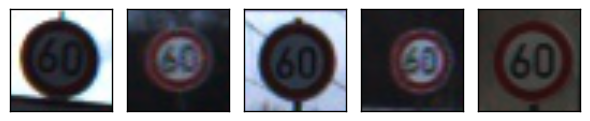

4:Speed limit (70km/h)


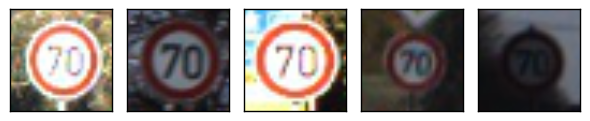

5:Speed limit (80km/h)


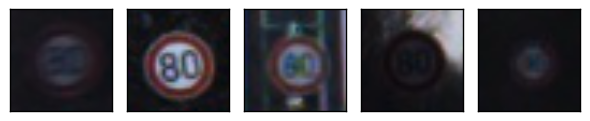

6:End of speed limit (80km/h)


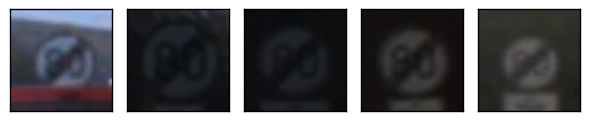

7:Speed limit (100km/h)


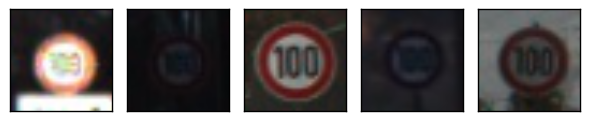

8:Speed limit (120km/h)


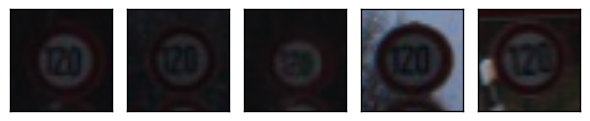

9:No passing


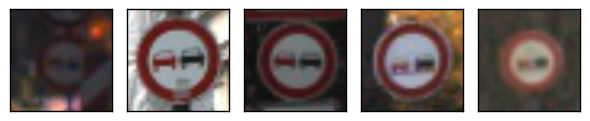

10:No passing for vechiles over 3.5 metric tons


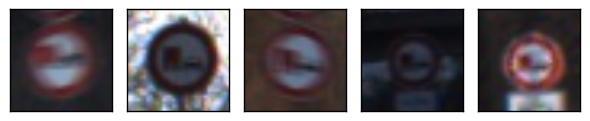

11:Right-of-way at the next intersection


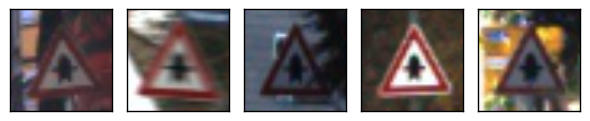

12:Priority road


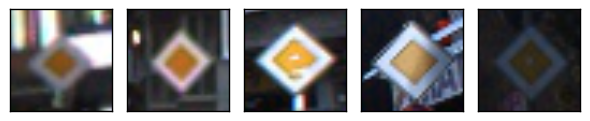

13:Yield


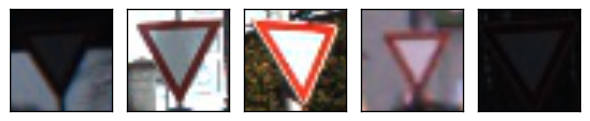

14:Stop


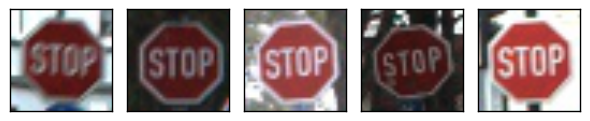

15:No vechiles


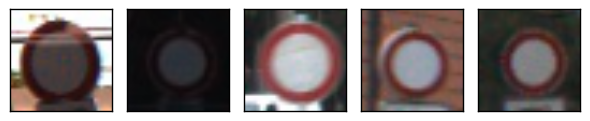

16:Vechiles over 3.5 metric tons prohibited


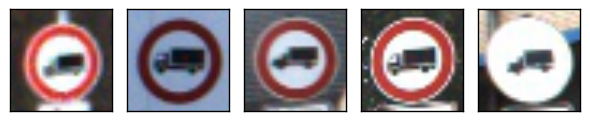

17:No entry


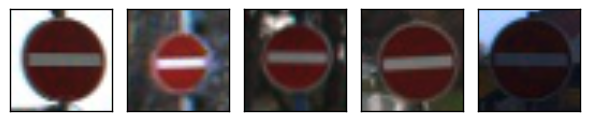

18:General caution


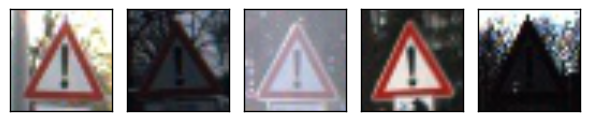

19:Dangerous curve to the left


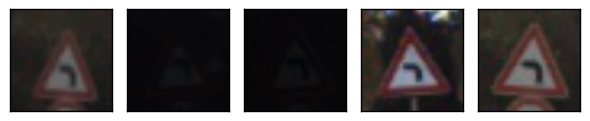

20:Dangerous curve to the right


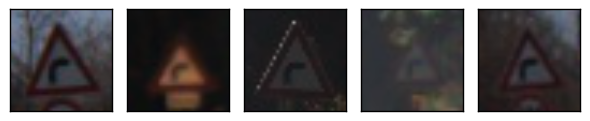

21:Double curve


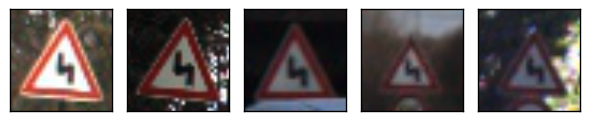

22:Bumpy road


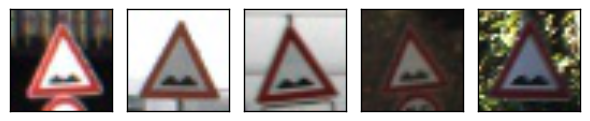

23:Slippery road


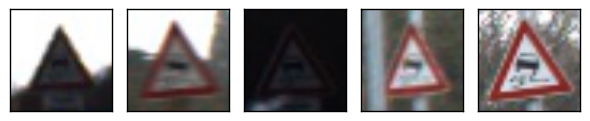

24:Road narrows on the right


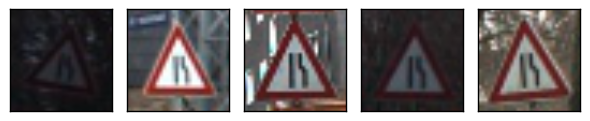

25:Road work


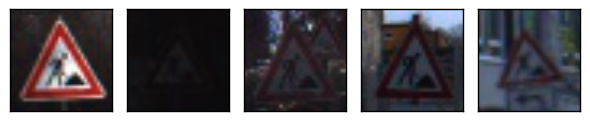

26:Traffic signals


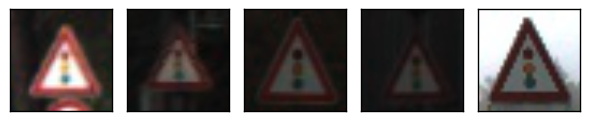

27:Pedestrians


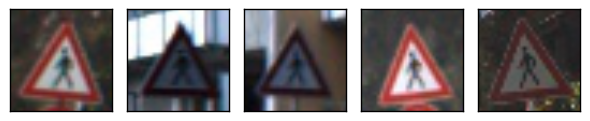

28:Children crossing


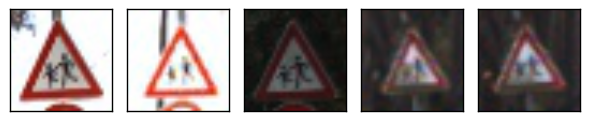

29:Bicycles crossing


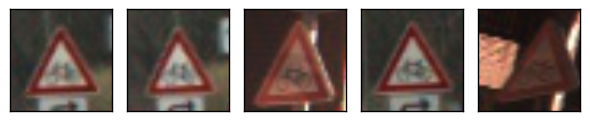

30:Beware of ice/snow


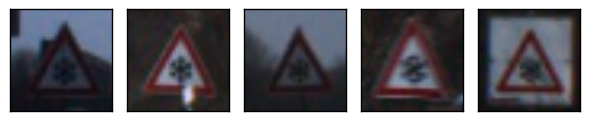

31:Wild animals crossing


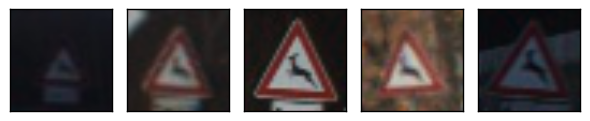

32:End of all speed and passing limits


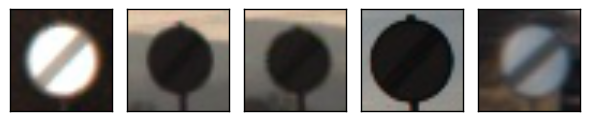

33:Turn right ahead


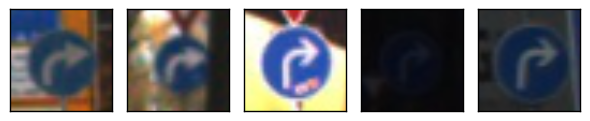

34:Turn left ahead


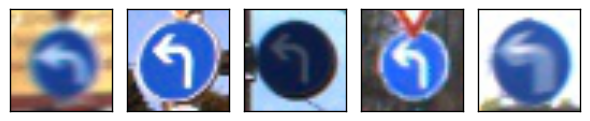

35:Ahead only


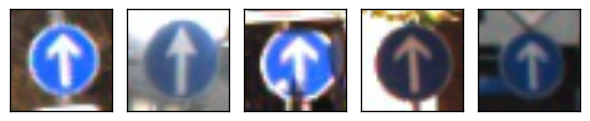

36:Go straight or right


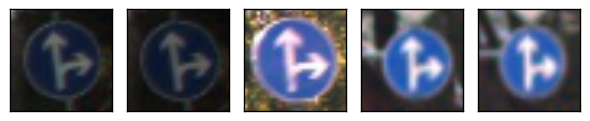

37:Go straight or left


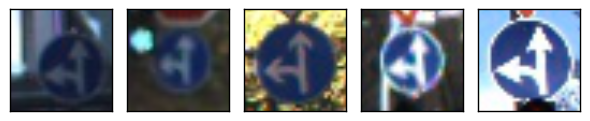

38:Keep right


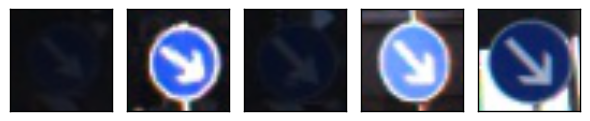

39:Keep left


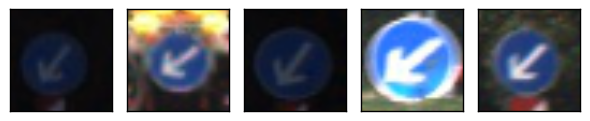

40:Roundabout mandatory


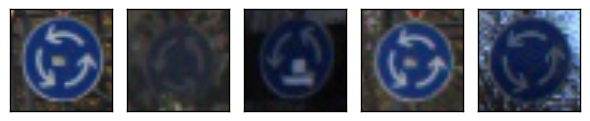

41:End of no passing


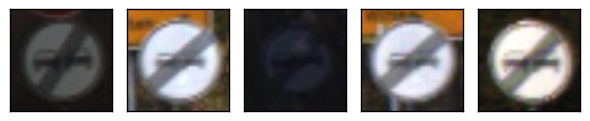

42:End of no passing by vechiles over 3.5 metric tons


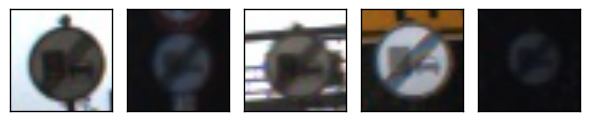

In [11]:
cnn.plot_five_images_per_track(cnn.df_train)

0:Speed limit (20km/h)


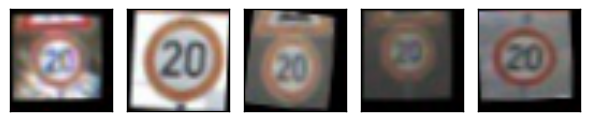

1:Speed limit (30km/h)


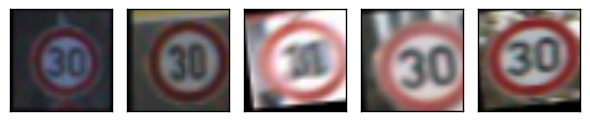

3:Speed limit (60km/h)


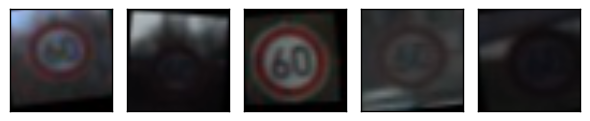

4:Speed limit (70km/h)


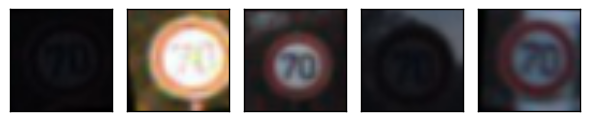

5:Speed limit (80km/h)


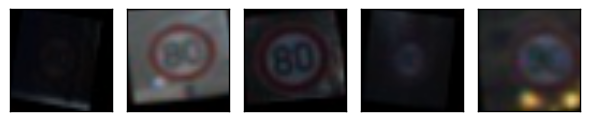

6:End of speed limit (80km/h)


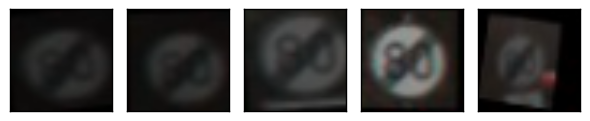

7:Speed limit (100km/h)


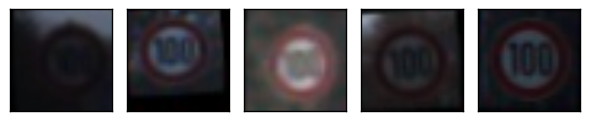

8:Speed limit (120km/h)


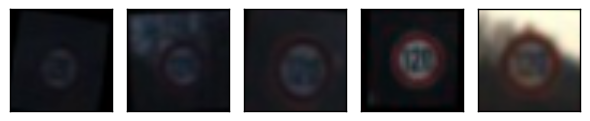

9:No passing


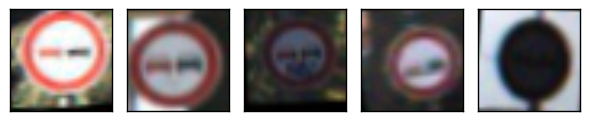

10:No passing for vechiles over 3.5 metric tons


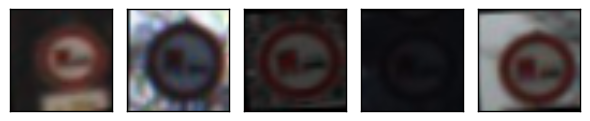

11:Right-of-way at the next intersection


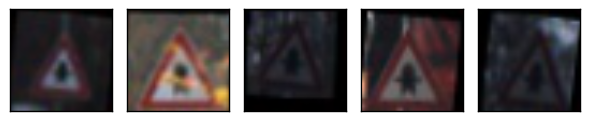

12:Priority road


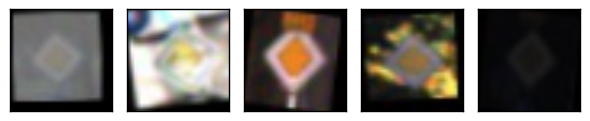

13:Yield


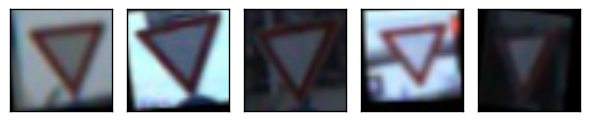

14:Stop


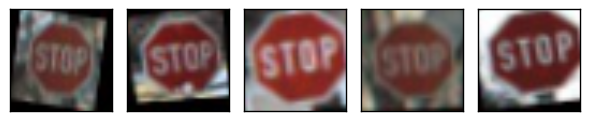

15:No vechiles


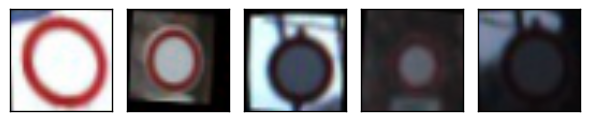

16:Vechiles over 3.5 metric tons prohibited


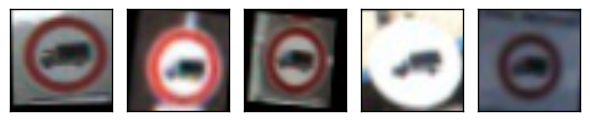

17:No entry


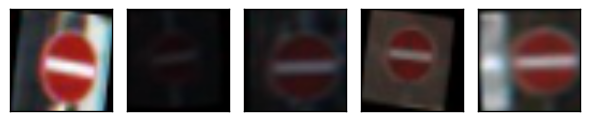

18:General caution


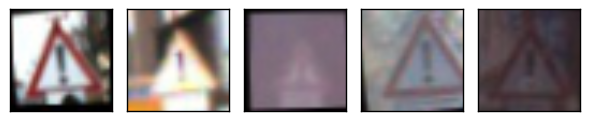

19:Dangerous curve to the left


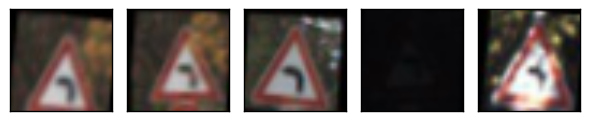

20:Dangerous curve to the right


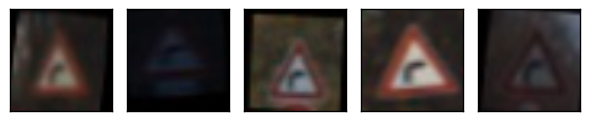

21:Double curve


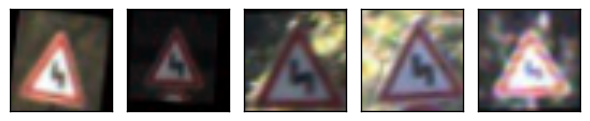

22:Bumpy road


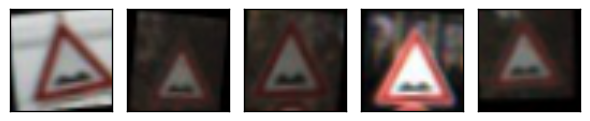

23:Slippery road


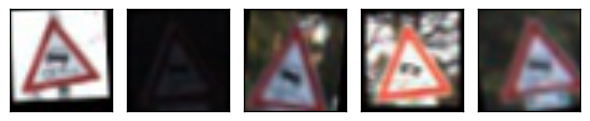

24:Road narrows on the right


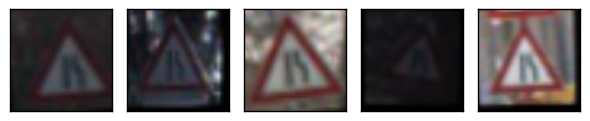

25:Road work


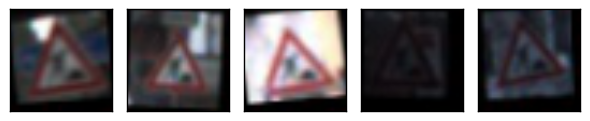

26:Traffic signals


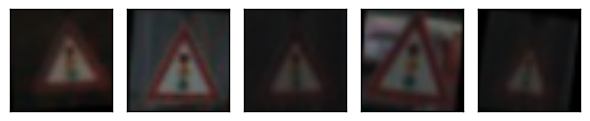

27:Pedestrians


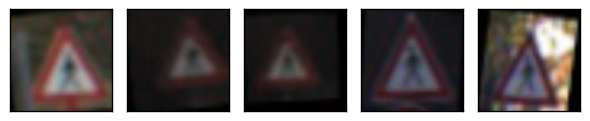

28:Children crossing


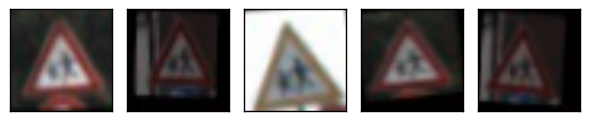

29:Bicycles crossing


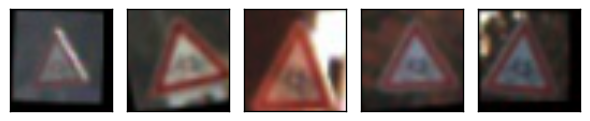

30:Beware of ice/snow


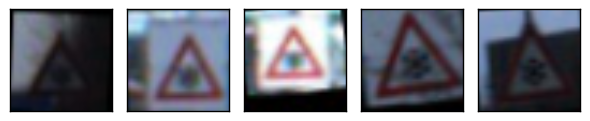

31:Wild animals crossing


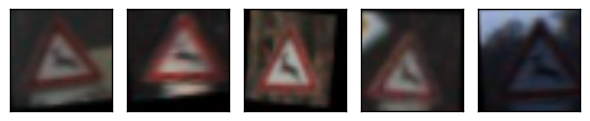

32:End of all speed and passing limits


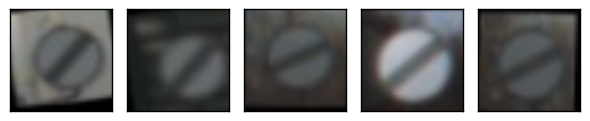

33:Turn right ahead


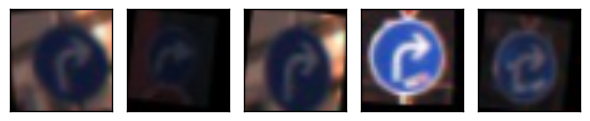

34:Turn left ahead


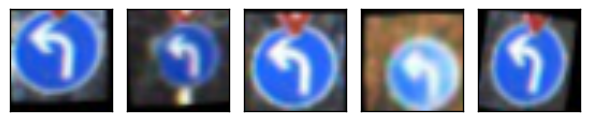

35:Ahead only


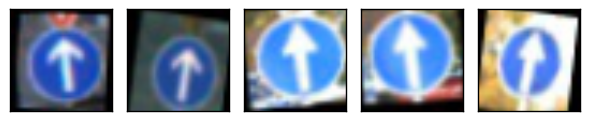

36:Go straight or right


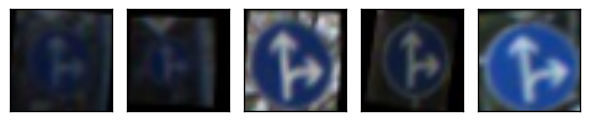

37:Go straight or left


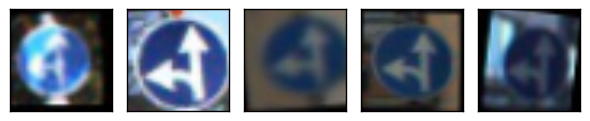

38:Keep right


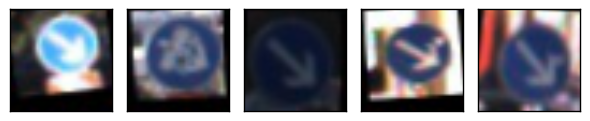

39:Keep left


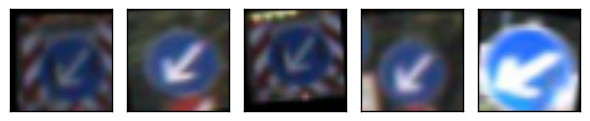

40:Roundabout mandatory


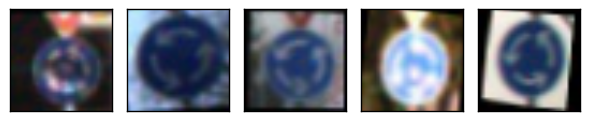

41:End of no passing


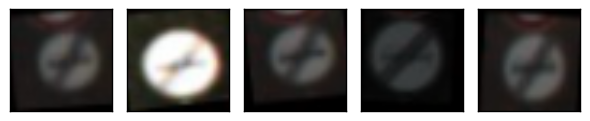

42:End of no passing by vechiles over 3.5 metric tons


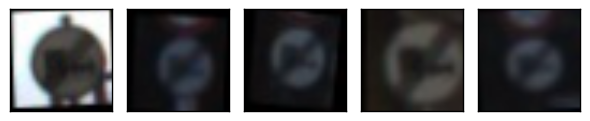

In [82]:
cnn.plot_five_images_per_track(cnn.df_jitter)

----

## Step 2: Design and Test a Model Architecture

Design and implement a deep learning model that learns to recognize traffic signs. Train and test your model on the [German Traffic Sign Dataset](http://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset).

There are various aspects to consider when thinking about this problem:

- Your model can be derived from a deep feedforward net or a deep convolutional network.
- Play around preprocessing techniques (normalization, rgb to grayscale, etc)
- Number of examples per label (some have more than others).
- Generate fake data.

Here is an example of a [published baseline model on this problem](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). It's not required to be familiar with the approach used in the paper but, it's good practice to try to read papers like these.

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

**Answer:** 

The implentation is in model3.py. 

The training is not done in iPython. Instead, run the following command to do training on AWS EC2 instance:

%python main.py

### Question 1 

_Describe the techniques used to preprocess the data._

**Answer:** (1) Convert the images to grayscale. (2)Normalize the image data to be between -0.5 and 0.5. (3) Add jittered images to the original dataset, so that each kind of traffic sign has equal number of samples.

Adding jittered images are done by running:

%python generate_jittered_image.py

Reason why the above preprocessing techniques are used. (1) Normalization is of course because of numeric stability. (2) Why grayscale? Because I reason that shape matters more in traffic sign recogonition. When a human is given a grayscale traffic sign, he should be able to recogonize it. And the CNN should target to recogonize grayscale traffic sign as well.  (3)Adding jittered image is because the distribution of classes are not balanced in the original datasets. By adding jittered image, it alleviate the problem that the data is skewed towards high freuqnecy traffic signs. 

### Question 2

_Describe how you set up the training, validation and testing data for your model. If you generated additional data, why?_

**Answer:** 

After adding the jittered image to the original traning set, the training set is split on a track base. That said, for each kind of traffic signs, 20% of traffic signs are assigned to validation set. The reason for jittered image is stated above.

I also unpack the .pickle file and put all the images into folder, so that I can use a python generator when traning the model. I do this because my computer is very old and I will overkill it if I dont use generator.

### Question 3

_What does your final architecture look like? (Type of model, layers, sizes, connectivity, etc.)  For reference on how to build a deep neural network using TensorFlow, see [Deep Neural Network in TensorFlow
](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/b516a270-8600-4f93-a0a3-20dfeabe5da6/concepts/83a3a2a2-a9bd-4b7b-95b0-eb924ab14432) from the classroom._


**Answer:** 

The model coded in model3.py. It will be described in words as follows:

input (None, 32 ,32)->conv1->max_pooling(2x2)->Relu(None,16,16,16)->

conv2->Relu(None,16,16,24)->

conv3->Relu(None,16,16,36)->

conv4->Relu(None,8,8,48)->drop_out(keep_prob=0.7)->

conv5->Relu(None,4,4,60)->

conv6->Relu(None,2,2,72)->drop_out(keep_prob=0.7)->

fc1->Relu(None,128)->drop_out(keep_prob=0.7)->drop_out(keep_prob=0.7)->

fc2(None,48)->Softmax

### Question 4

_How did you train your model? (Type of optimizer, batch size, epochs, hyperparameters, etc.)_


**Answer:** 

To train a model, run:
%python main.py

Optimizer: Adam; Learning rate = 1e-3; loss function: cross_entropy; batch_size = 256
The model is trained for 50 epochs. Each epochs will go through all samples in the training set (including the generated jittered image)

### Question 5


_What approach did you take in coming up with a solution to this problem?_

**Answer:**

In my first submission, I used a model with two layers of conv layer plus two fully connected layers. Other students has reported that they can train their two-layer conv-nets to overfit the training data. However in my case I could not replicate their results. So I switch to more complex network. And I end up the above network with 6 conv layers and 2 FC layers.

Also I use Adam optimizer because of its adaptive nature. I tried using Adagrad and DelataAdaGrad optimizer, but they seem to fail to converge (loss never decreased). 

Drop out layers are added to help with generalization. So are max pooling for the first layer. With these regulization, I can only get 88% accuracy on test set. With regulization I get 91% on test set.

The learning rate is determined emperically. However Adam optimizer is good so I just use the default learning rate 1e-3. If given more time I will try smaller value and bigger value. 

Since I use the AWS GPU instance, I dare to use a relatively bigger batch size. Bigger batch size generally helps the training to converge faster.

And number of epochs are also determined empirically. I simply watch the validation accuracy to see if it saturates to certain value. Mayber I will try to increase number of epochs in the future to see if the model can do a little better.

In the following code blocks, the accuracy for the test set is generated (91%). The change of validation accuracy as number of epochs increases is plotted. Loss as number of batches increases is plotted. Also the confusion matrix, and examples or wrong prediction are also plotted for analysis.

In [84]:
# Accuracy history per epochs
history_file = "./log/history.pickle"
with open(history_file, mode='rb') as f:
    history = pickle.load(f)

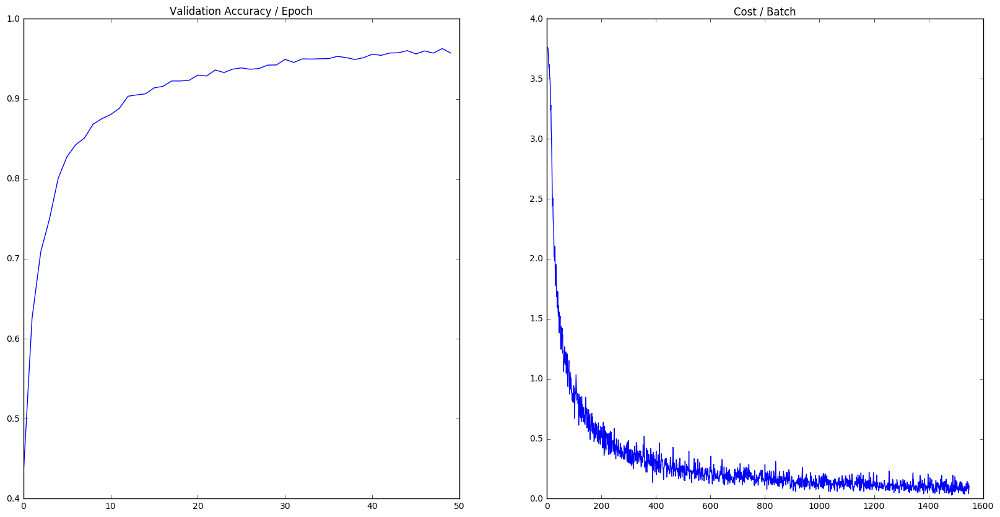

In [85]:
val_acc_epoch = history["val_acc_epoch"]
cost_batch = history["cost_batch"]
f, (ax0,ax1) = plt.subplots(1,2, figsize=(20,10))
ax0.plot(val_acc_epoch)
ax0.set_title("Validation Accuracy / Epoch")
ax1.plot(cost_batch)
ax1.set_title("Cost / Batch")

Train Acc: 0it [00:00, ?it/s]

computing Train Acc(entire training set, no spliting)...


Train Acc: 1226it [02:34,  7.93it/s]
Test Acc: 0it [00:00, ?it/s]

OrigTrainAcc=0.9798123836517334
computing Test Acc...


Test Acc: 395it [00:50,  7.77it/s]


testAcc=0.9159091114997864
training set confusion matrix
     0     1     2     3     4     5    6     7     8     9     10    11  \
0   201     8     0     0     1     0    0     0     0     0     0     0   
1     9  2147    23     4    18     1    0     5     1     0     0     0   
2     1    25  2192     1    13     6    0     4     2     0     2     0   
3     0     2     4  1365     0    32    0     0     1     0     0     0   
4     0    22     8     0  1944     1    0     0     3     0     0     0   
5     0     8    38    14     1  1764    0    18     5     0     4     0   
6     0     0     0     0     0     0  419     0     0     0     0     0   
7     2     6     6     1     6    17    0  1392     6     1     0     0   
8     0     2     4     2    12     5    0    15  1368     0     0     0   
9     0     0     0     2     0     0    0     2     0  1457     3     0   
10    0     0     2     0     0     6    0     3     1     8  1982     0   
11    0     0     0     0     0

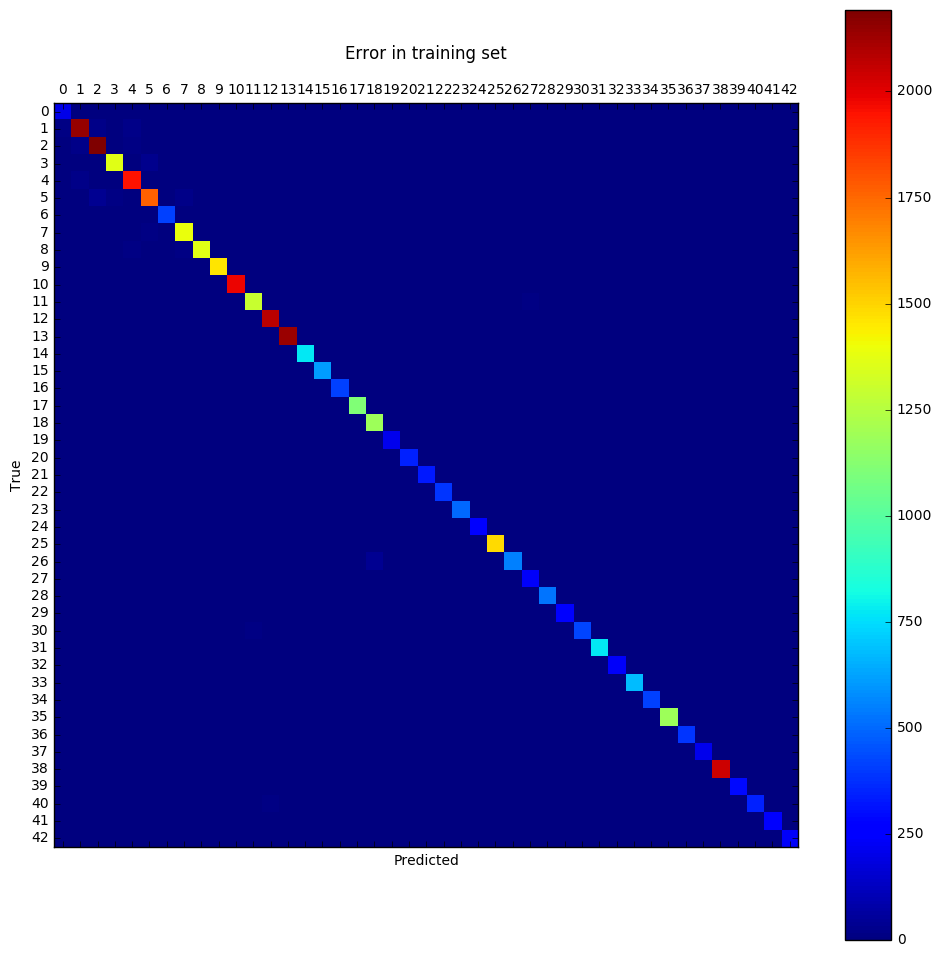

test set confusion matrix
    0    1    2    3    4    5    6    7    8    9    10   11   12   13   14  \
0   44    7    0    0    1    0    0    0    8    0    0    0    0    0    0   
1    3  684   15    1    5    0    0    5    2    0    0    0    3    0    0   
2    0    9  729    1    6    3    0    0    0    0    0    0    0    0    0   
3    0    0    5  410    0   25    0    1    1    0    1    0    0    1    0   
4    4   12    3    1  608    2    1    5    5    0    0    0    7    0    0   
5    0    6   54   10    5  533    1   11    7    0    0    0    1    0    0   
6    0    0    0    9    0    1  124    2    0    0    0    0    5    0    0   
7    0    1    5    3    5   10    0  411   14    0    0    0    1    0    0   
8    1    0    3    8    4    6    0    6  405    4    0    0    1    0    0   
9    0    0    1    6    0    0    0    1    0  466    3    0    0    0    0   
10   0    0    0    4    0   11    0    5    1    0  629    1    0    0    0   
11   0    0   

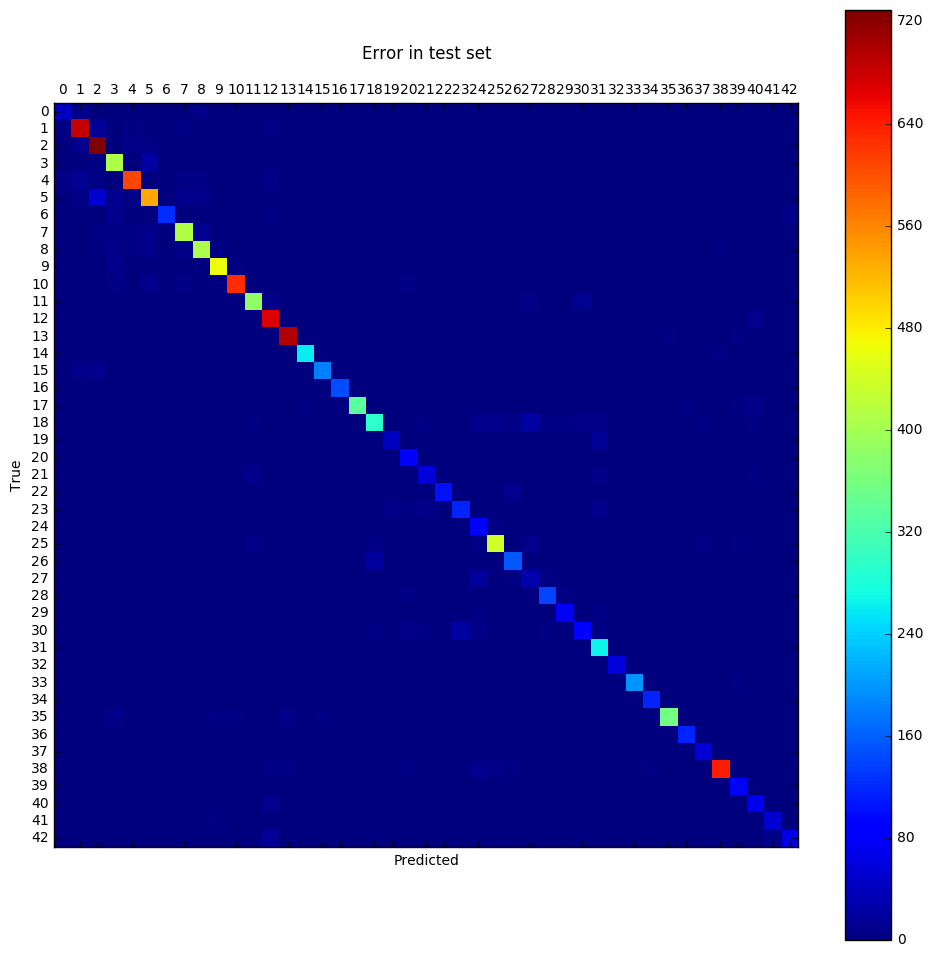

In [7]:
df_train_trained, df_test_trained = cnn.test_saved_model(model_path="./log/model.ckt")

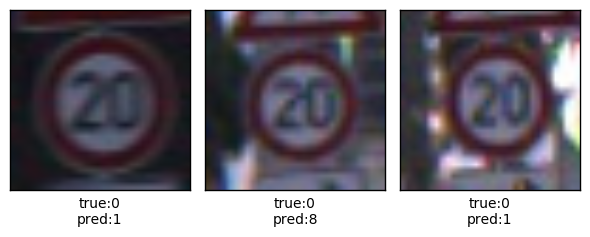

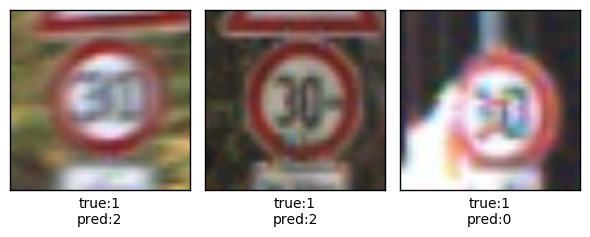

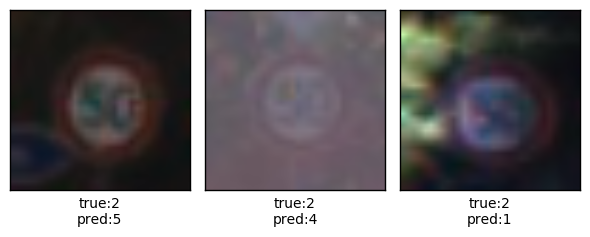

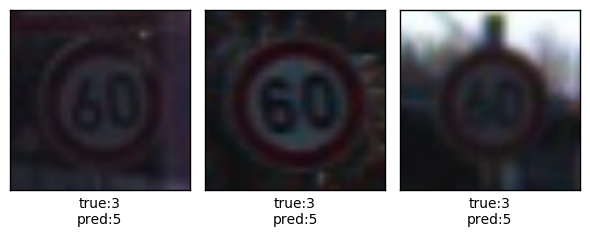

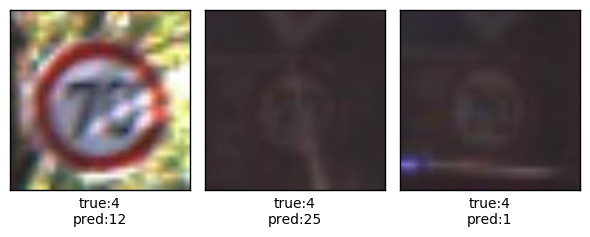

...

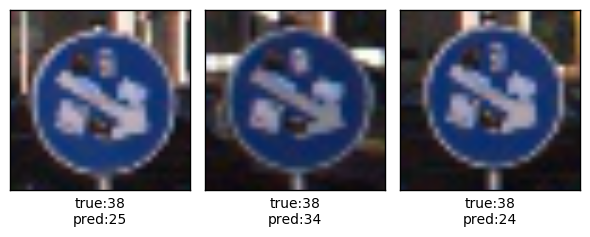

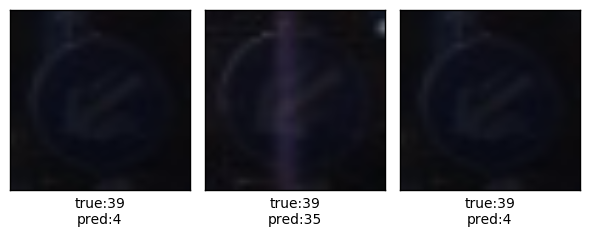

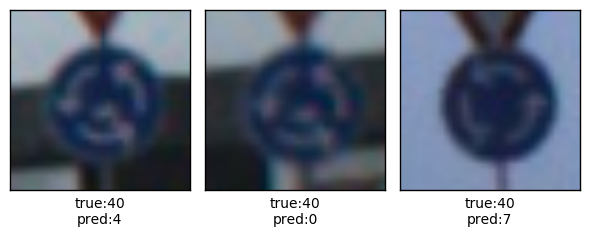

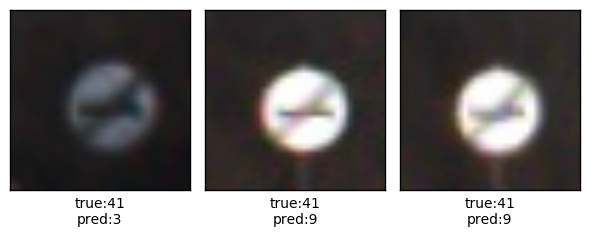

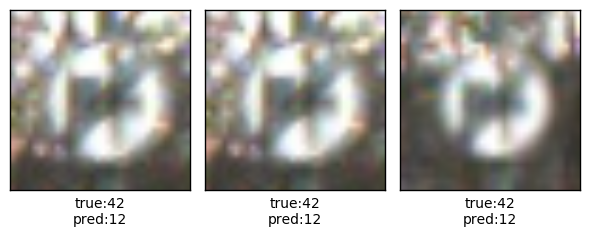

In [8]:
cnn.plot_error_examples(df_test_trained)

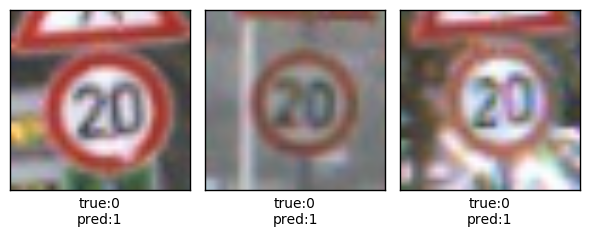

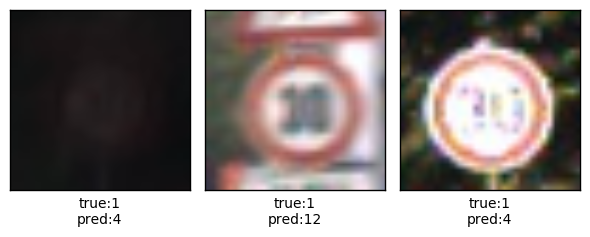

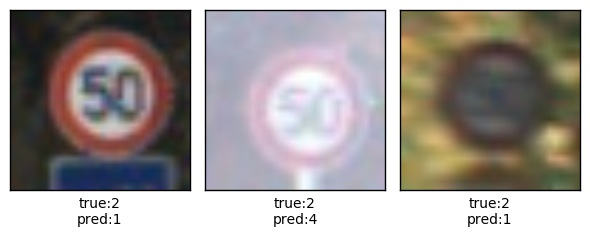

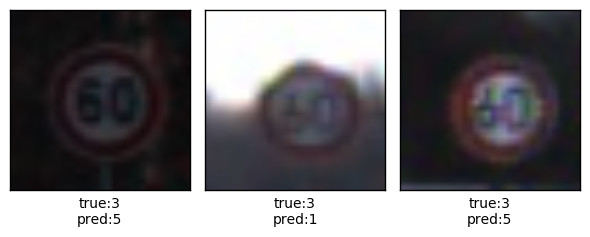

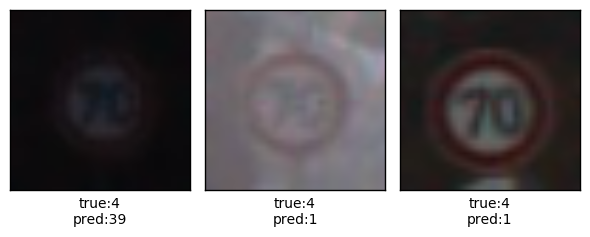

...

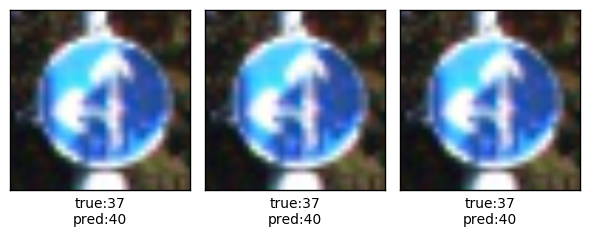

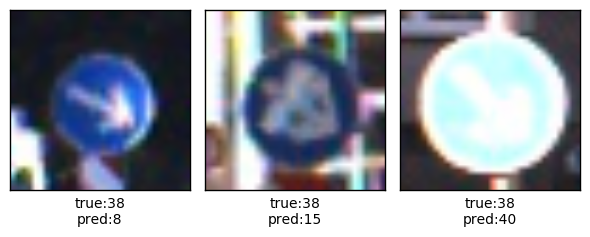

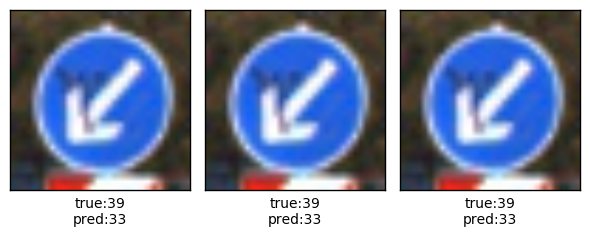

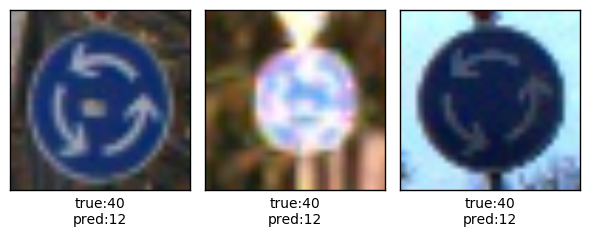

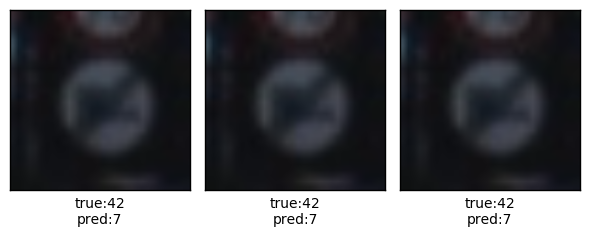

In [9]:
cnn.plot_error_examples(df_train_trained)

---

## Step 3: Test a Model on New Images

Take several pictures of traffic signs that you find on the web or around you (at least five), and run them through your classifier on your computer to produce example results. The classifier might not recognize some local signs but it could prove interesting nonetheless.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

**Answer:**

The prediction function is packaged in CNN.py (predict(self,img,model_path))

### Question 6

_Choose five candidate images of traffic signs and provide them in the report. Are there any particular qualities of the image(s) that might make classification difficult? It would be helpful to plot the images in the notebook._



**Answer:** 

5 Images from the internet are evaluated using the trained model and results will be presented in the last code blocks of this notebook. 

(1) The first image is "Go on left road" sign in Hongkong. The model succeeds in recogonizing it.

(2) The second image is no-parking. However in the original training set we dont have relevant data, so the model has failed.

(3) The 3rd is no-entry. The model succeeds.

(4) 4th is 30km/s speed limit. Interestingly, the correct answer appeas on the 5th that the model is most confident about. The model fails probably because in the training set, the speed limit is round shape. However this sample is square shape.

(5) For the 5th(stop sign) the model works very well.

### Question 7

_Is your model able to perform equally well on captured pictures or a live camera stream when compared to testing on the dataset?_


**Answer:** Not yet. Some of the captured images(no parking) do not have corresponding samples in the training set. So the model does not learning very well about that. For the 30km speed limit, the training set does contain another kind of speed limit sign but they are of round shape. The model ranks the 30km speed limit as the 5th in the prediction result, which means the model does captured something related to the number '30'.

### Question 8

*Use the model's softmax probabilities to visualize the **certainty** of its predictions, [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.11/api_docs/python/nn.html#top_k) could prove helpful here. Which predictions is the model certain of? Uncertain? If the model was incorrect in its initial prediction, does the correct prediction appear in the top k? (k should be 5 at most)*


**Answer:** 

The plots and predicions and code bloks are as follows. For answer to this question, please refer to Question 6.

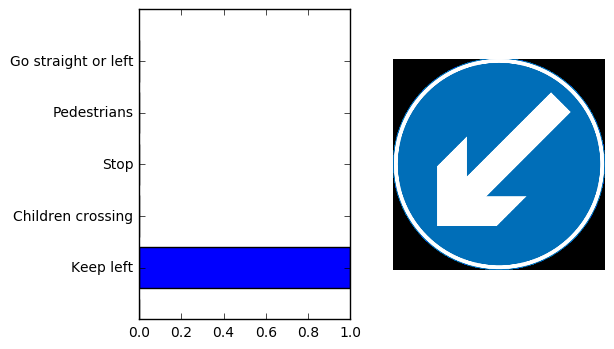

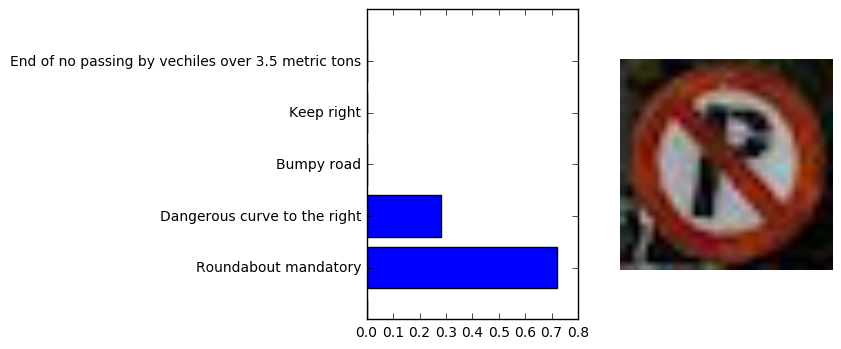

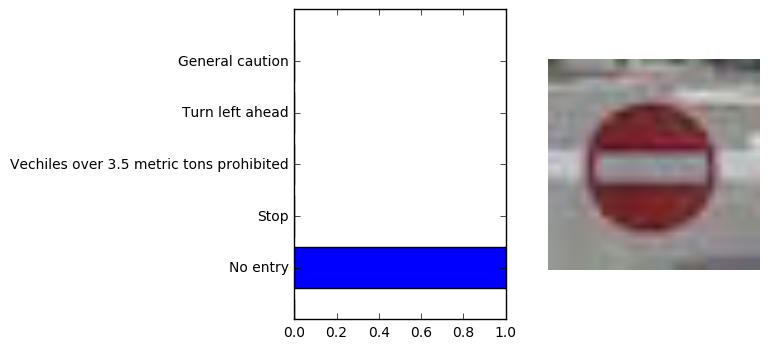

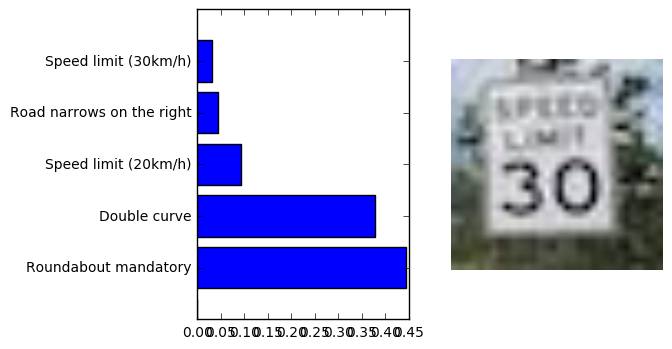

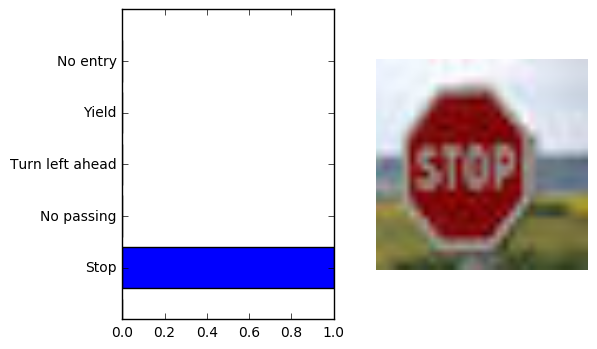

In [81]:
import os
samples = os.listdir("./myimg/")
i=0
for sample in samples:
    img = cv2.imread("./myimg/"+sample)
    conf,indices = cnn.predict(img,"./log/model.ckt")
    f, (ax0,ax1) = plt.subplots(1,2)
    ax1.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    ax1.axis('off')
    conf_adjust = [0]
    conf_adjust.extend(conf)
    indices_str = [""]
    indices_str.extend([cnn.labelDict[str(i)] for i in indices])
    ax0.barh(range(len(indices_str)), conf_adjust, align='center')
    ax0.set_yticklabels(indices_str)
    ax0.set_ylim(ymin=0)
    plt.show()

### Question 9
_If necessary, provide documentation for how an interface was built for your model to load and classify newly-acquired images._


**Answer:**

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.